In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.special
import anndata as ad
import seaborn as sb
from scipy.sparse import issparse
from scipy.stats import ranksums
from statsmodels.stats import multitest
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=[(0, 'lightgrey'),  (0.9, '#ff0000'), (1, '#8b0000')])

In [2]:
# Read data
adata = sc.read("../Data/Subset/WithLouvain.h5ad")

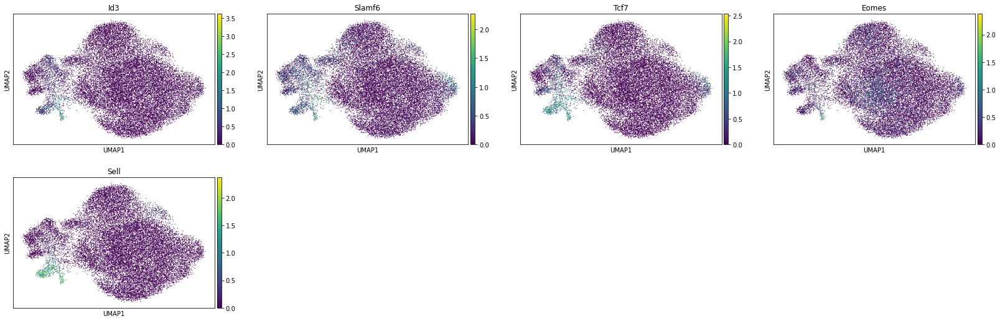

In [8]:
# Exploration of gene expressions
# Genes to find top left ear
sc.pl.umap(adata, color=['Id3', 'Slamf6', 'Tcf7', "Eomes", "Sell"])

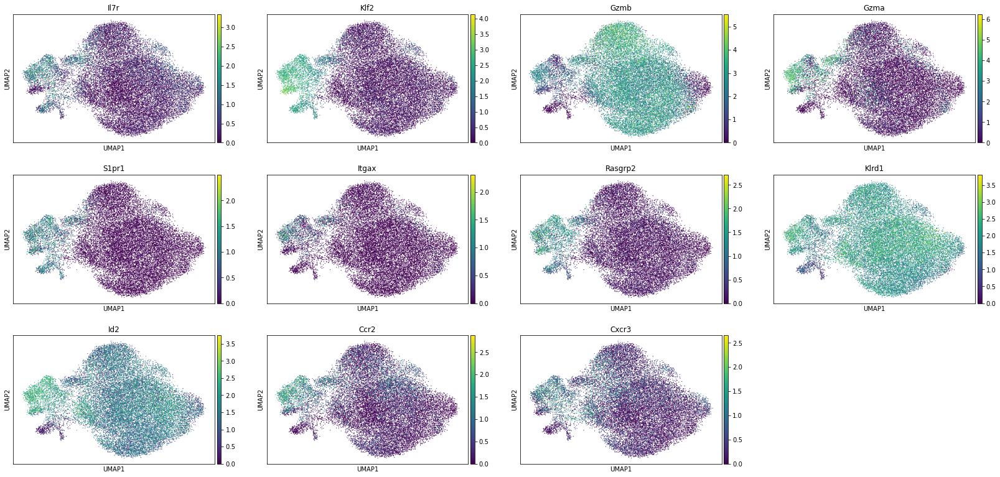

In [9]:
# Genes to identify top right ear
sc.pl.umap(adata, color=["Il7r", "Klf2", "Gzmb", "Gzma", "S1pr1", "Itgax", "Rasgrp2", "Klrd1", "Id2", "Ccr2", "Cxcr3"])

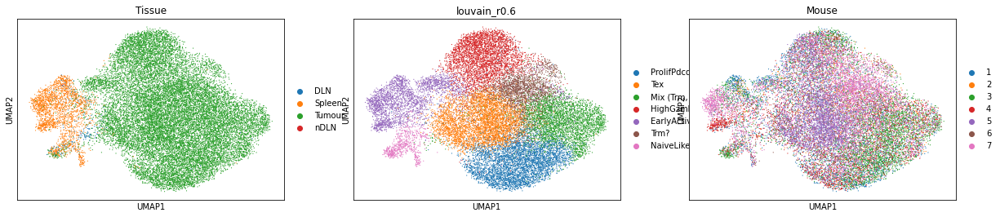

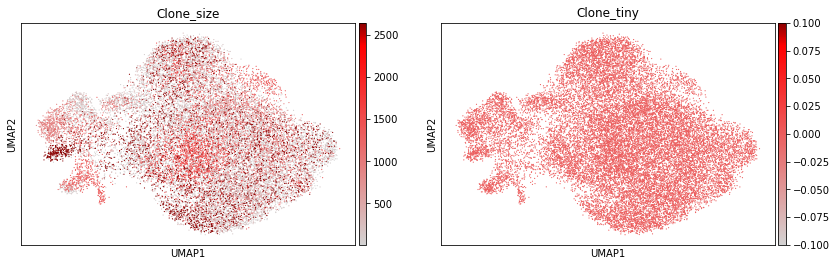

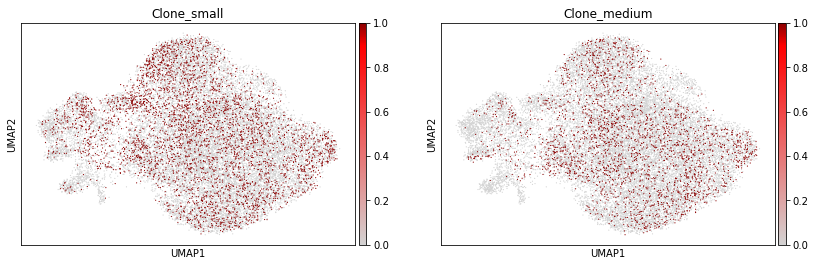

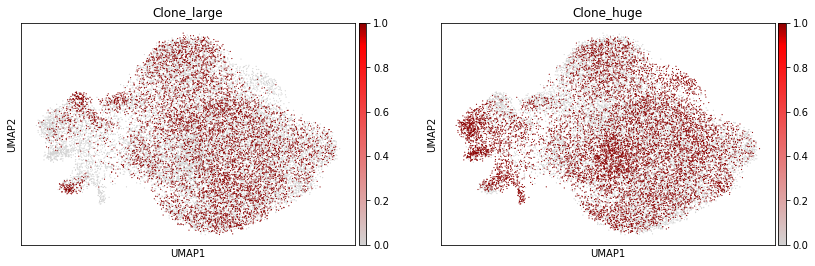

In [10]:
# Cluster cells and observe distribution of cells and corresponding clones
sc.pl.umap(adata, color=['Tissue', 'louvain_r0.6', "Mouse"])
sc.pl.umap(adata, color=['Clone_size','Clone_tiny'], cmap=cmap)
sc.pl.umap(adata, color=['Clone_small', 'Clone_medium'], cmap=cmap)
sc.pl.umap(adata, color=['Clone_large', 'Clone_huge'], cmap=cmap)

<AxesSubplot:xlabel='None-Mouse', ylabel='louvain_r0.6'>

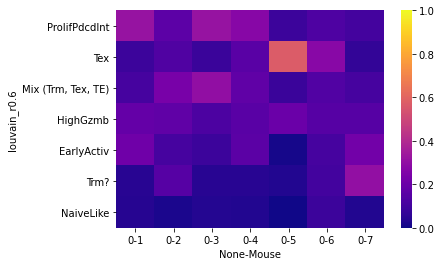

In [12]:
# Observe if one cluster is dominated by one batch (batch-effect)
pd.set_option('display.max_rows', None)
sb.heatmap(pd.DataFrame(pd.DataFrame(adata.obs[["louvain_r0.6", "Mouse"]]).groupby(["louvain_r0.6", "Mouse"]).size()/pd.DataFrame(adata.obs["Mouse"]).groupby(["Mouse"]).size()).unstack(), cmap='plasma', vmin=0, vmax=1)

In [13]:
# Select genes to label observed populations

marker_genes = {
    "Naive": ["Lef1", "Il7r", "Sell", "Ccr7", "Tcf7", "Bcl2"],
    "Trm_simple": ["Cd69", "Itgae"],
    "Trm_Schu": ['Gzmc', 'Fabp5', 'Fos', 'Ccr8', 'Havcr2', 'Tnfsf9', 'Fn1', 'Emp1', 'Ifitm2', 'Ifng', 'Tigit', 'Fosl2','Tnf', 'Ifitm3', 'Il2ra', 'Gzmb', 'Cd244', 'Icos', 'Itgae', 'Itga1', 'Litaf', 'Nr4a1', 'Qpct', 'Rgs2', 'Hpgds', 'Jun', 'Junb', 'Cdh1', 'Ctla4', 'Inpp4b', 'Rgs1', 'Sik1', 'Skil', 'Tmem123', 'Vps37b', 'Xcl1'],
    "Tcircm_Schu": ['S1pr1', 'Itgax', 'Gzmm', 'Adam4', 'Elovl7', 'Klre1', 'Rasgrp2', 'Tlr1', 'Ly6c1', 'Samd3', 'Klf3', 'Itga4', 'Eomes', 'Ifi213', 'Tnfsf8', 'Cxcr5', 'Icam2', 'Fut11', 'Sell', 'Cmah', 'Fgf13', 'S1pr5', 'Sidt1', 'Slamf6', 'Usp33'],
    "Teff_acute": ["Klrg1", "Klrd1", "Gzma", "Gzmb", "Id2", "Ccr2"],
    "Teff_to_Trm": ["Cd69", "Itgae", "Il7r"],
    "MP": ["Tcf7", "Sell", "Cd28", "Il7r", "Cd27", "Cxcr3"],
    "TE": ["Klrg1", "Klf2", "Tbx21", "Cx3cr1", "Zeb2", "Gzmb", "Ifng", "Il2ra"],
    "Tex": ["Pdcd1", "Lag3", "Tigit", "Tox", "Slamf6", "Bcl2", "Tcf7"],
    "Proliferation": ["Birc5", "Ube2c"],
}
miller_genes = {
    "Effector-like": ["Cx3cr1", "Klf2", "Klrc1", "Klrd1", "Klrk1"],
    "Terminally-Exh": ["Cd160", "Cxcr6", "Ccl4", "Lag3", "Gzma"],
    "Progenitor-Exh": ["Xcl1", "Id3", "Slamf6", "Tcf7", "Il7r"],
    "Proliferating": ["Stmn1", "Top2a", "Hmgb2", "H2afz", "Tubb5"],
    "Naive-like": ["Ccr7", "Satb1", "Lef1", "Sell"],
}

In [14]:
# Rank genes associated with each cluster
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.6', key_added='rank_genes_r0.6')

<AxesSubplot:>

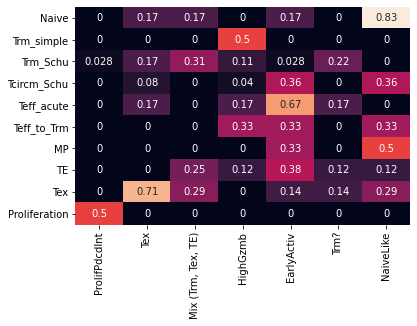

In [15]:
# Observe if annotation genes correspond with any of the clusters
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes, top_n_markers=200, key='rank_genes_r0.6', normalize='reference')
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

<AxesSubplot:>

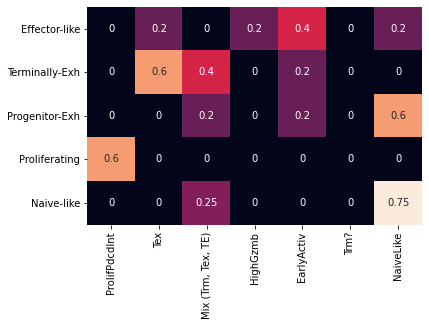

In [16]:
# Cross validatite with other gene annotation datasets
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, miller_genes, top_n_markers=100, key='rank_genes_r0.6', normalize='reference')
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

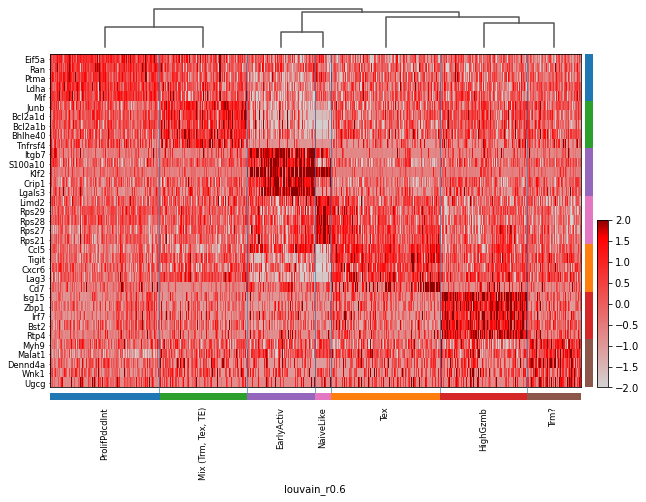

In [18]:
# Heatmap of highly differentiated genes between clusters
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, use_raw=False, key = 'rank_genes_r0.6', cmap=cmap, swap_axes=True
        ,                               vmin=-2, vmax=2, min_logfoldchange=1)

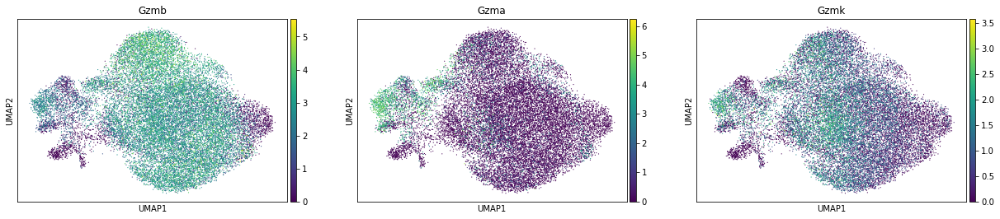

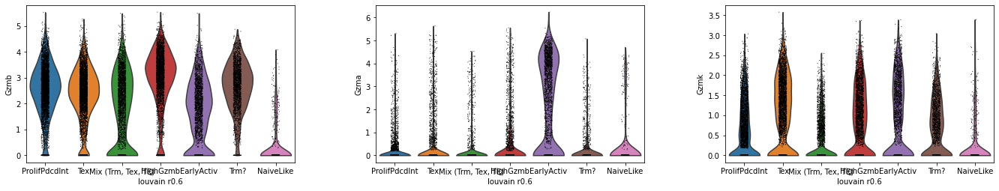

In [20]:
# Observe expression levels of key genes
# "Bst2", "Rtp4", "Isg15", "Zbp1", "Irf7"
sc.pl.umap(adata, color=["Gzmb", "Gzma", "Gzmk"])
sc.pl.violin(adata, groupby="louvain_r0.6", keys=["Gzmb", "Gzma", "Gzmk"])

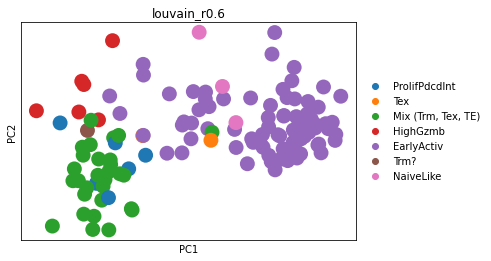

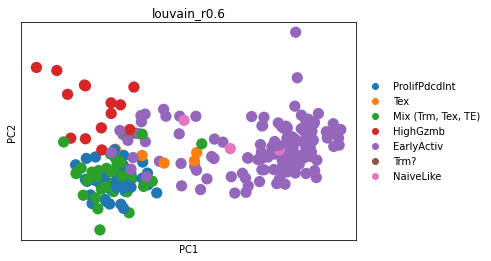

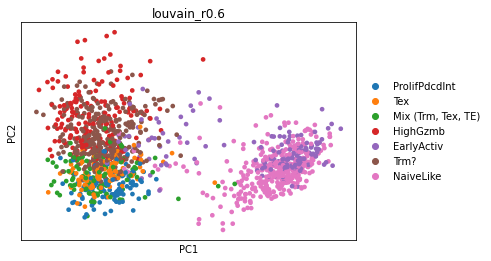

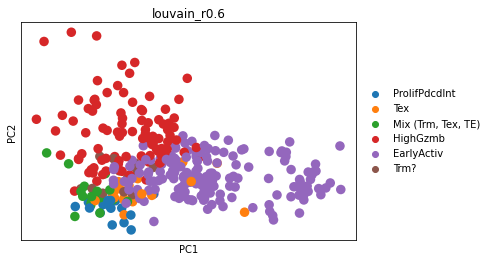

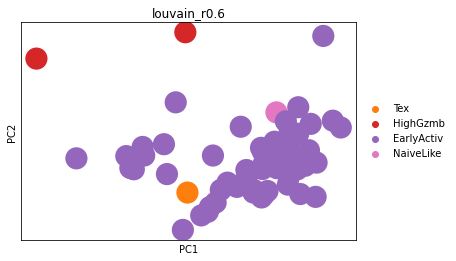

In [22]:
# Observe distribution of clones on PCA
a = list(adata[adata.obs["Clone_size"]>50].obs["CTaa"].unique())
sc.tl.pca(adata)
for k in a[0:5]:
    e = adata[adata.obs["CTaa"]==k]
    #sc.pp.neighbors(e, n_neighbors=10)
    #sc.tl.diffmap(e)
    sc.pl.pca(e, color="louvain_r0.6", components=['1,2'])

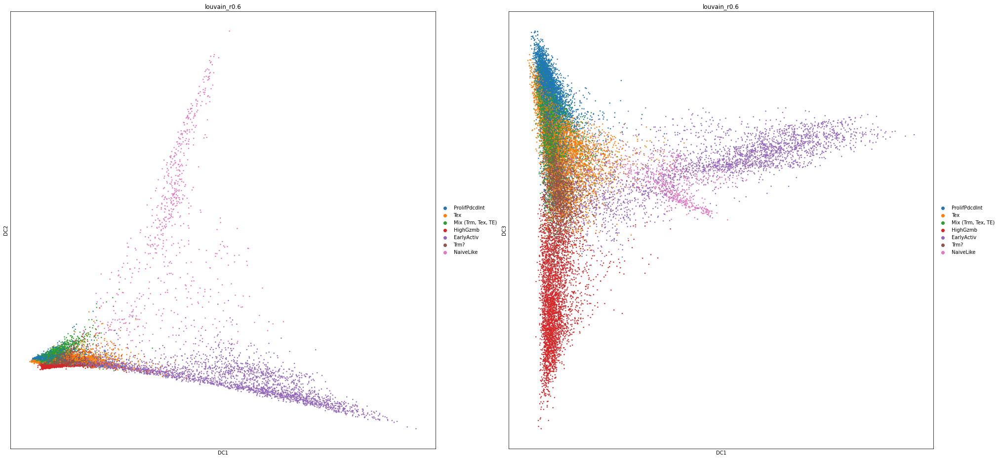

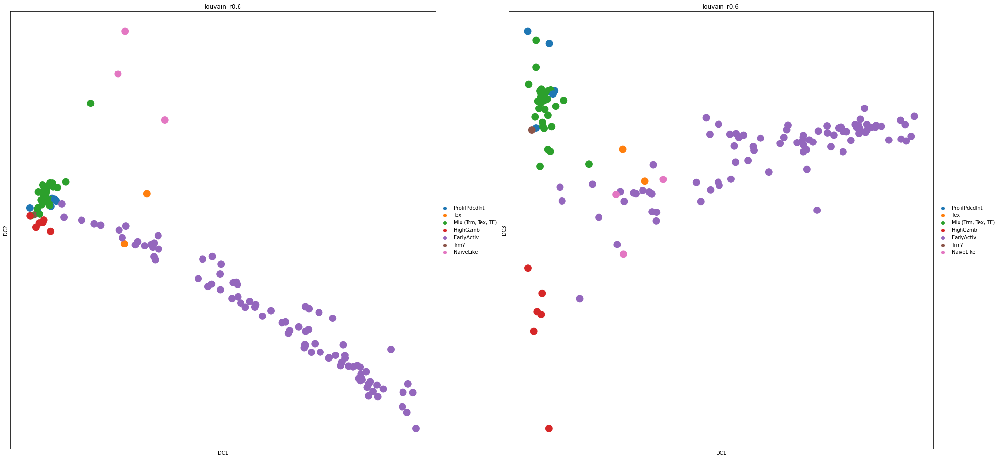

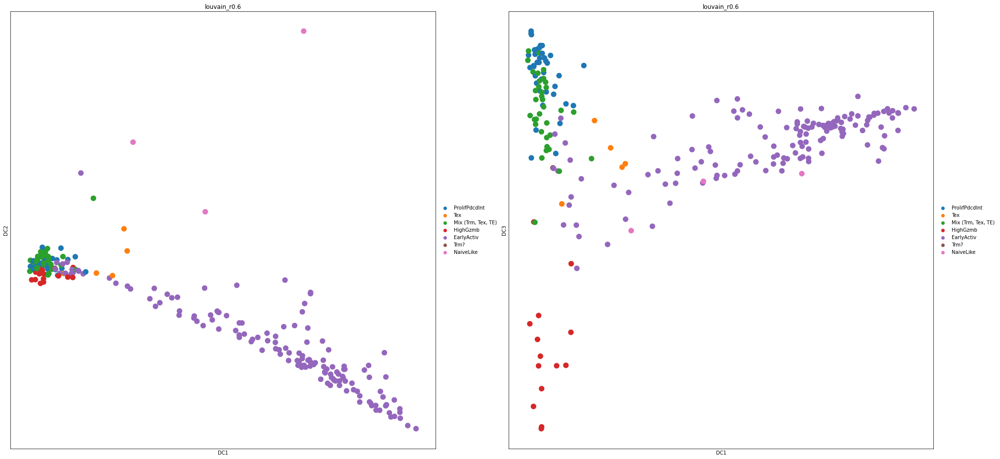

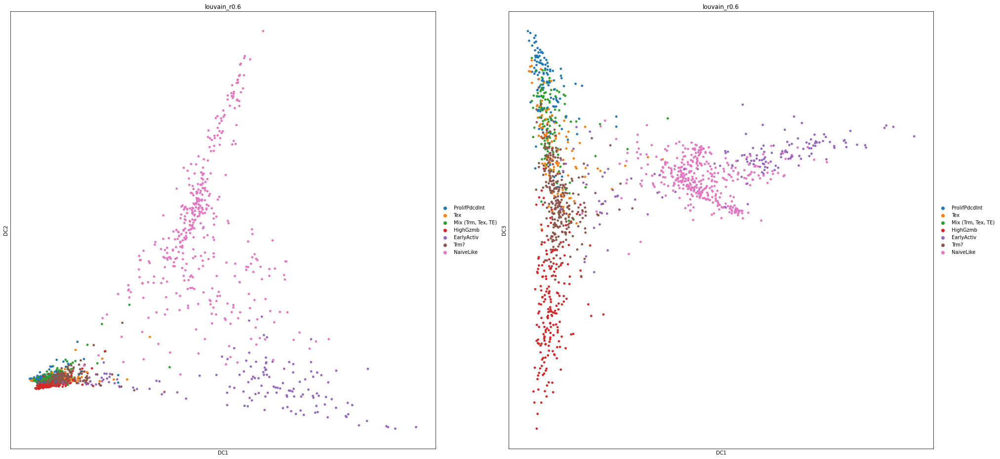

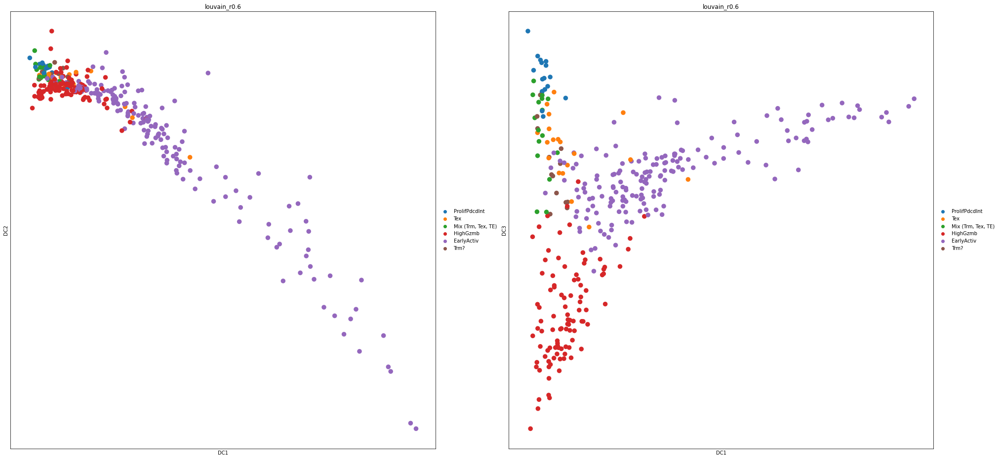

...

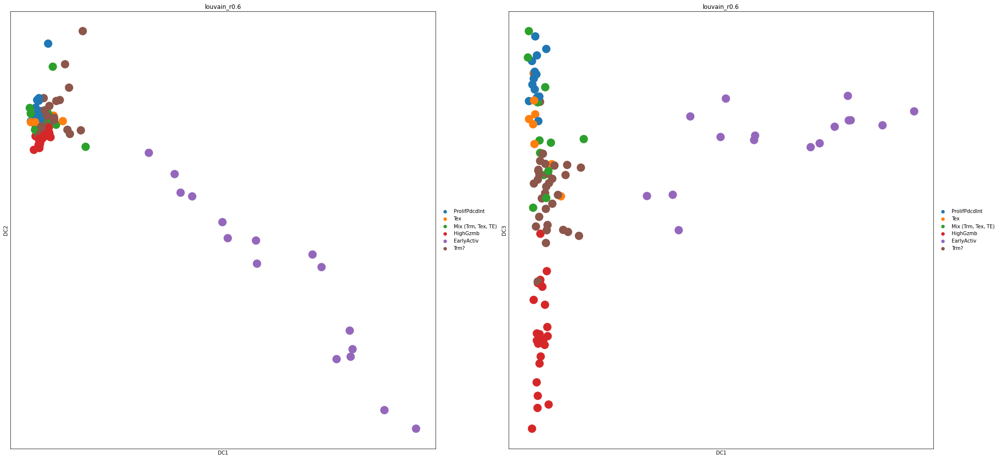

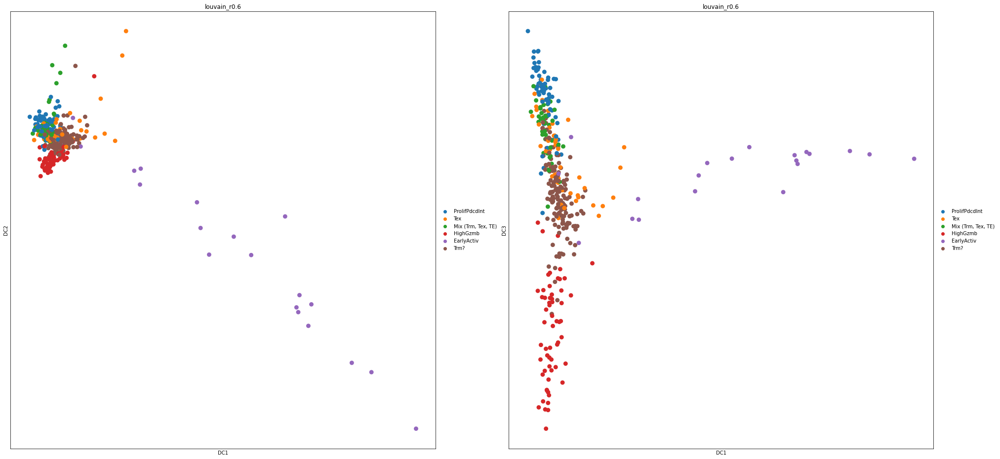

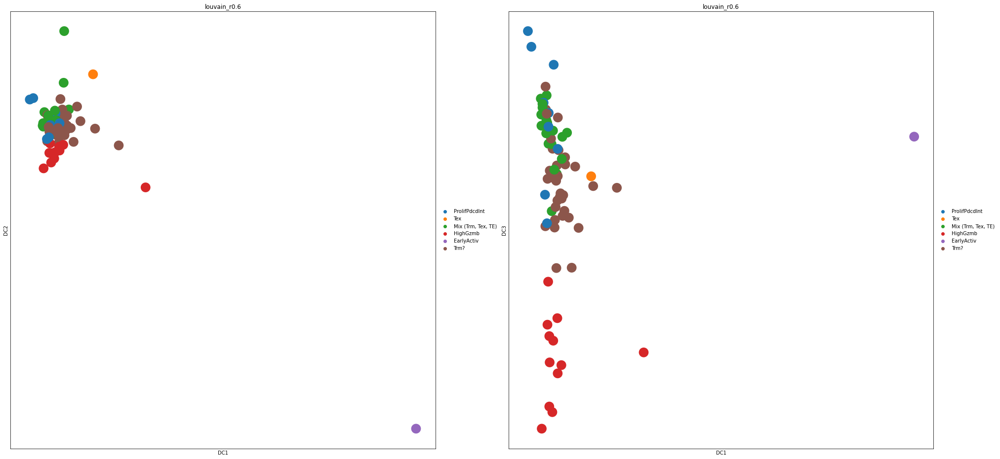

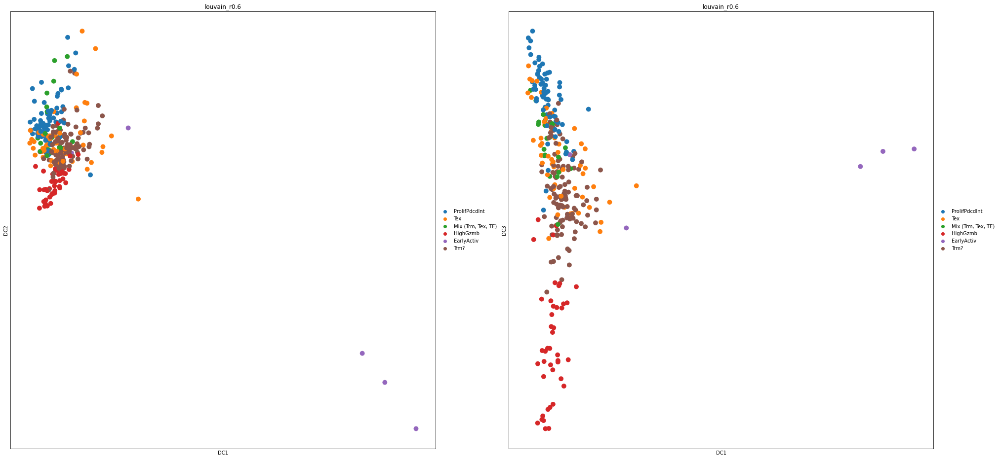

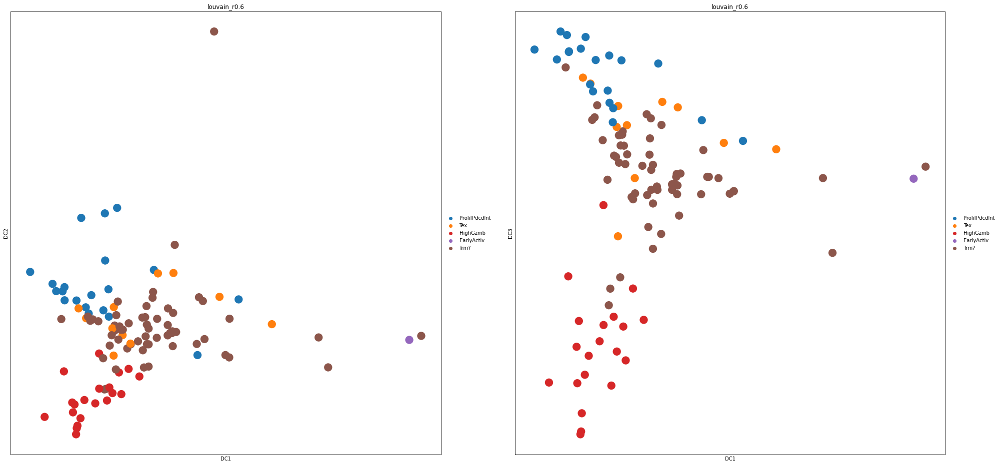

In [7]:
# Observe distribution of clones on diffusion map
a = list(adata[adata.obs["Clone_size"]>50].obs["CTaa"].unique())
sc.tl.diffmap(adata)
for k in a[0:5]:
    e = adata[adata.obs["CTaa"]==k]
    #sc.pp.neighbors(e, n_neighbors=10)
    #sc.tl.diffmap(e)
    sc.pl.diffmap(e, color="louvain_r0.6", components=['1,2', '1,3'])